In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import scipy.stats

In [2]:
cleaned_data = 'NFL_Game_Data.csv'
games = pd.read_csv(cleaned_data)
games.head()

,Date,Week,Day,Time,HomeTeam,AwayTeam,HomePoints,AwayPoints,HomeYards,AwayYards,...,Home_Avg_YardsAllowed,Home_Avg_TurnoversForced,Home_WinRate,Away_Avg_PointsScored,Away_Avg_YardsEarned,Away_Avg_Turnovers,Away_Avg_PointsAllowed,Away_Avg_YardsAllowed,Away_Avg_TurnoversForced,Away_WinRate
0,2017-10-19,7,Thu,8:25PM,Las Vegas Raiders,Kansas City Chiefs,31,30,505,425,...,349.83,0.83,0.33,29.50,387.00,0.17,21.67,378.17,1.33,0.83
1,2017-10-22,7,Sun,1:00PM,Minnesota Vikings,Baltimore Ravens,24,16,357,208,...,295.50,1.33,0.67,19.00,289.17,2.00,20.67,330.83,2.33,0.50
2,2017-10-22,7,Sun,1:00PM,Los Angeles Rams,Arizona Cardinals,33,0,425,196,...,350.17,1.67,0.67,19.83,356.00,1.50,26.33,340.33,1.00,0.50
3,2017-10-22,7,Sun,1:00PM,Cleveland Browns,Tennessee Titans,9,12,284,269,...,310.67,1.17,0.00,24.33,336.00,1.50,27.33,337.00,1.17,0.50
4,2017-10-22,7,Sun,1:00PM,Chicago Bears,Carolina Panthers,17,3,153,293,...,302.67,1.00,0.33,21.33,323.50,1.67,20.33,280.00,0.67,0.67


In [3]:
pd.to_datetime(games['Date'])

0      2017-10-19
1      2017-10-22
2      2017-10-22
3      2017-10-22
4      2017-10-22
          ...    
1950   2024-11-03
1951   2024-11-03
1952   2024-11-03
1953   2024-11-03
1954   2024-11-04
Name: Date, Length: 1955, dtype: datetime64[ns]

In [4]:
print(games.describe())

        HomePoints   AwayPoints    HomeYards    AwayYards  HomeTurnovers  \
count  1955.000000  1955.000000  1955.000000  1955.000000    1955.000000   
mean     23.683887    21.953964   350.004604   338.341176       1.297187   
std      10.080349     9.916691    83.507907    86.045641       1.181644   
min       0.000000     0.000000    89.000000    47.000000       0.000000   
25%      17.000000    16.000000   293.000000   280.000000       0.000000   
50%      24.000000    21.000000   352.000000   338.000000       1.000000   
75%      30.000000    29.000000   405.000000   396.500000       2.000000   
max      70.000000    59.000000   726.000000   643.000000       7.000000   

       AwayTurnovers      HomeWin  Home_Avg_PointsScored  \
count    1955.000000  1955.000000            1955.000000   
mean        1.335038     0.551407              22.802368   
std         1.174958     0.497478               5.274130   
min         0.000000     0.000000               7.500000   
25%         0.0

In [5]:
# Check for missing values in the dataset
print(games.isnull().sum())

Date                        0
Week                        0
Day                         0
Time                        0
HomeTeam                    0
AwayTeam                    0
HomePoints                  0
AwayPoints                  0
HomeYards                   0
AwayYards                   0
HomeTurnovers               0
AwayTurnovers               0
HomeWin                     0
Home_Team_Name              0
Away_Team_Name              0
Home_Avg_PointsScored       0
Home_Avg_YardsEarned        0
Home_Avg_Turnovers          0
Home_Avg_PointsAllowed      0
Home_Avg_YardsAllowed       0
Home_Avg_TurnoversForced    0
Home_WinRate                0
Away_Avg_PointsScored       0
Away_Avg_YardsEarned        0
Away_Avg_Turnovers          0
Away_Avg_PointsAllowed      0
Away_Avg_YardsAllowed       0
Away_Avg_TurnoversForced    0
Away_WinRate                0
dtype: int64


In [6]:
# Check the data types of each column
print(games.dtypes)

Date                         object
Week                         object
Day                          object
Time                         object
HomeTeam                     object
AwayTeam                     object
HomePoints                    int64
AwayPoints                    int64
HomeYards                     int64
AwayYards                     int64
HomeTurnovers                 int64
AwayTurnovers                 int64
HomeWin                       int64
Home_Team_Name               object
Away_Team_Name               object
Home_Avg_PointsScored       float64
Home_Avg_YardsEarned        float64
Home_Avg_Turnovers          float64
Home_Avg_PointsAllowed      float64
Home_Avg_YardsAllowed       float64
Home_Avg_TurnoversForced    float64
Home_WinRate                float64
Away_Avg_PointsScored       float64
Away_Avg_YardsEarned        float64
Away_Avg_Turnovers          float64
Away_Avg_PointsAllowed      float64
Away_Avg_YardsAllowed       float64
Away_Avg_TurnoversForced    

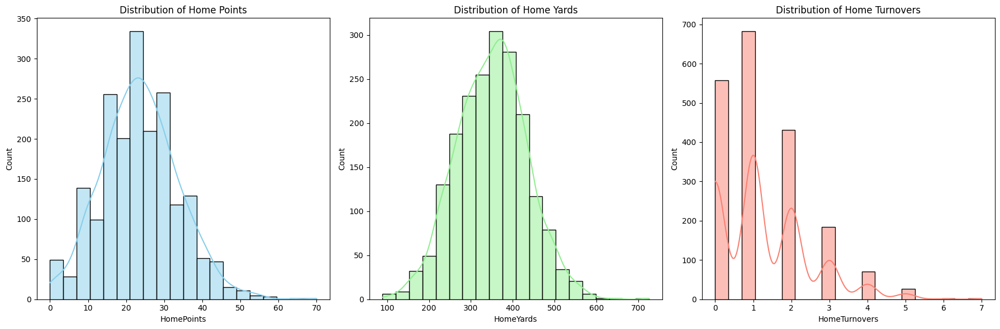

In [7]:
# Plot the distribution of key numerical features
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Points distribution for Home Team
sns.histplot(games['HomePoints'], bins=20, kde=True, ax=axes[0], color="skyblue")
axes[0].set_title('Distribution of Home Points')

# Yards distribution for Home Team
sns.histplot(games['HomeYards'], bins=20, kde=True, ax=axes[1], color="lightgreen")
axes[1].set_title('Distribution of Home Yards')

# Turnovers distribution for Home Team
sns.histplot(games['HomeTurnovers'], bins=20, kde=True, ax=axes[2], color="salmon")
axes[2].set_title('Distribution of Home Turnovers')

plt.tight_layout()
plt.show()


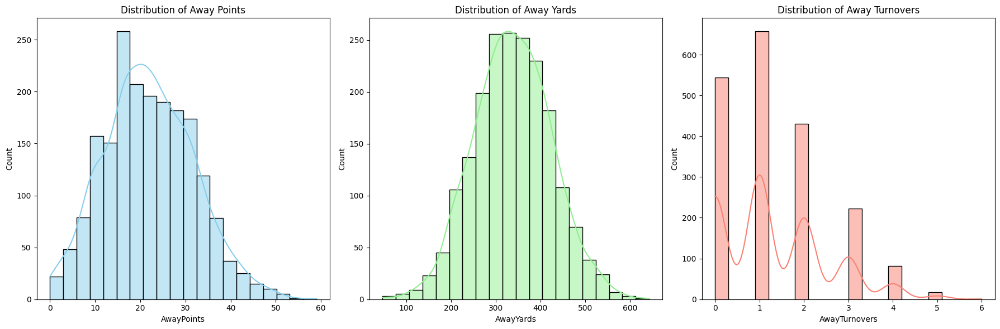

In [8]:
# Plot the distribution of key numerical features
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Points distribution for Away Team
sns.histplot(games['AwayPoints'], bins=20, kde=True, ax=axes[0], color="skyblue")
axes[0].set_title('Distribution of Away Points')

# Yards distribution for Away Team
sns.histplot(games['AwayYards'], bins=20, kde=True, ax=axes[1], color="lightgreen")
axes[1].set_title('Distribution of Away Yards')

# Turnovers distribution for Away Team
sns.histplot(games['AwayTurnovers'], bins=20, kde=True, ax=axes[2], color="salmon")
axes[2].set_title('Distribution of Away Turnovers')

plt.tight_layout()
plt.show()

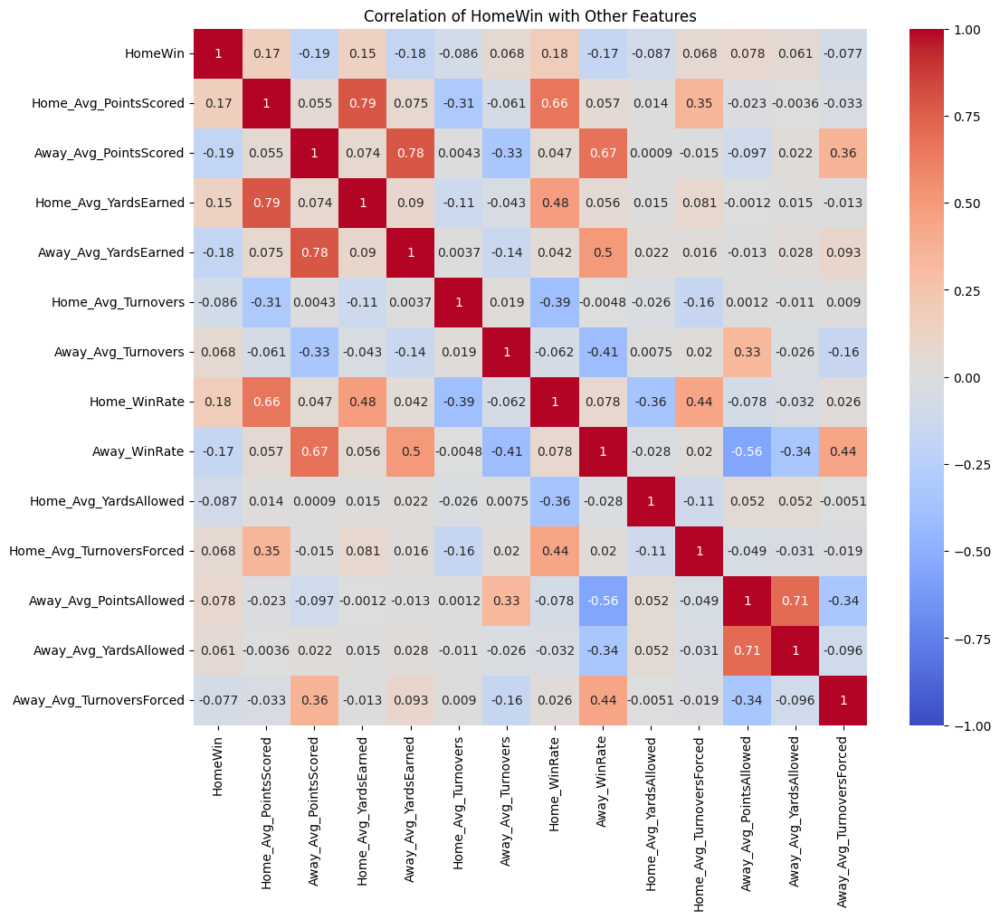

In [19]:
# Select columns
corr_columns = [
    'HomeWin', 'Home_Avg_PointsScored', 'Away_Avg_PointsScored', 'Home_Avg_YardsEarned', 
    'Away_Avg_YardsEarned', 'Home_Avg_Turnovers', 'Away_Avg_Turnovers', 'Home_WinRate', 
    'Away_WinRate', 'Home_Avg_YardsAllowed', 'Home_Avg_TurnoversForced', 'Away_Avg_PointsAllowed', 
    'Away_Avg_YardsAllowed', 'Away_Avg_TurnoversForced'
]

# calc corr matrix
corr_matrix = games[corr_columns].corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation of HomeWin with Other Features")
plt.show()


In [20]:
corr_matrix

,HomeWin,Home_Avg_PointsScored,Away_Avg_PointsScored,Home_Avg_YardsEarned,Away_Avg_YardsEarned,Home_Avg_Turnovers,Away_Avg_Turnovers,Home_WinRate,Away_WinRate,Home_Avg_YardsAllowed,Home_Avg_TurnoversForced,Away_Avg_PointsAllowed,Away_Avg_YardsAllowed,Away_Avg_TurnoversForced
HomeWin,1.000000,0.167311,-0.185811,0.146055,-0.178682,-0.085824,0.067625,0.179280,-0.165176,-0.087375,0.067633,0.078251,0.060779,-0.077236
Home_Avg_PointsScored,0.167311,1.000000,0.054835,0.785795,0.074630,-0.306807,-0.061057,0.662792,0.056787,0.014150,0.345602,-0.022814,-0.003563,-0.032898
Away_Avg_PointsScored,-0.185811,0.054835,1.000000,0.073803,0.781568,0.004262,-0.329956,0.047218,0.672904,0.000903,-0.015209,-0.097325,0.021715,0.361364
Home_Avg_YardsEarned,0.146055,0.785795,0.073803,1.000000,0.089869,-0.112720,-0.043213,0.480316,0.055820,0.014561,0.080901,-0.001205,0.015291,-0.013485
Away_Avg_YardsEarned,-0.178682,0.074630,0.781568,0.089869,1.000000,0.003681,-0.136570,0.042456,0.497380,0.021902,0.015685,-0.012730,0.028272,0.092501
Home_Avg_Turnovers,-0.085824,-0.306807,0.004262,-0.112720,0.003681,1.000000,0.018819,-0.394950,-0.004792,-0.026195,-0.156797,0.001202,-0.010771,0.009018
Away_Avg_Turnovers,0.067625,-0.061057,-0.329956,-0.043213,-0.136570,0.018819,1.000000,-0.062245,-0.411777,0.007469,0.020429,0.328932,-0.025910,-0.163020
Home_WinRate,0.179280,0.662792,0.047218,0.480316,0.042456,-0.394950,-0.062245,1.000000,0.078296,-0.355457,0.440334,-0.077883,-0.032148,0.026205
Away_WinRate,-0.165176,0.056787,0.672904,0.055820,0.497380,-0.004792,-0.411777,0.078296,1.000000,-0.027854,0.019854,-0.562312,-0.338544,0.441063
Home_Avg_YardsAllowed,-0.087375,0.014150,0.000903,0.014561,0.021902,-0.026195,0.007469,-0.355457,-0.027854,1.000000,-0.105510,0.051939,0.052435,-0.005108


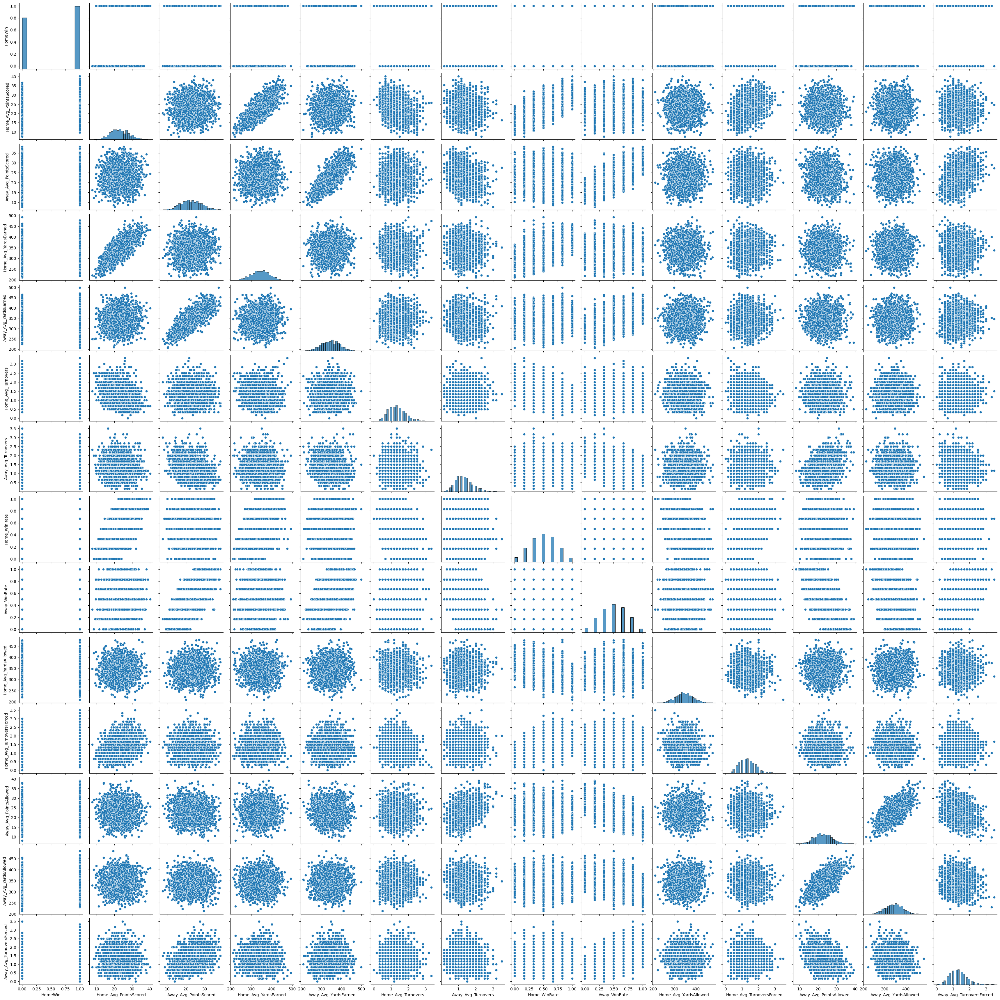

In [21]:
# PairPlot
sns.pairplot(games[corr_columns])
plt.show()

In [7]:
-----

SyntaxError: invalid syntax (3311633845.py, line 1)

OLD EDA

In [2]:
# Import Data
data = 'Team_Stats.csv'
teamstats = pd.read_csv(data)
teamstats.head()

,Unnamed: 0,Total_Games,Win_Rate,Avg_PtsScored,Avg_PtsAllowed,Avg_Yards,Avg_YardsAllowed,Avg_TurnoverDiff,Avg_PointDiff,Avg_YardDiff,...,Away_PtsScored,Home_Yards,Away_Yards,Home_Turnover,Away_Turnover,Last5_Win_Rate,Last5_Avg_PtsScored,Last5_Avg_PtsAllowed,Last5_Avg_TurnoverDiff,Last5_Avg_PointDiff
0,Kansas City Chiefs,134.0,0.75,28.44,21.63,394.07,352.11,-0.26,6.81,41.96,...,29.62,377.76,412.73,1.00,1.32,1.0,21.6,15.0,-0.4,6.6
1,Dallas Cowboys,121.0,0.59,26.17,21.66,373.12,336.02,-0.24,4.50,37.09,...,22.38,396.68,349.93,1.25,1.20,0.4,31.8,18.2,-1.2,13.6
2,Green Bay Packers,122.0,0.59,24.10,22.19,349.22,337.34,-0.23,1.91,11.88,...,24.11,357.93,346.26,0.89,1.16,0.8,31.0,20.4,-0.8,10.6
3,Carolina Panthers,116.0,0.36,20.19,24.19,322.60,336.54,0.33,-4.00,-13.94,...,19.64,327.25,318.12,1.40,1.53,0.2,21.0,8.6,-1.2,12.4
4,Los Angeles Rams,126.0,0.61,25.33,21.75,362.90,333.90,-0.09,3.58,29.01,...,25.19,364.27,360.75,1.27,1.31,0.8,25.8,22.0,0.4,3.8


In [3]:
# New df without string column to begin investigating relations in the data
# Rename the "Unnamed: 0" column to "Team"
teamstats.rename(columns={'Unnamed: 0': 'Team'}, inplace=True)

# Set the "Team" column as the index of the DataFrame
teamstats.set_index('Team', inplace=True)

# Display the updated DataFrame to confirm
teamstats.head()

,Total_Games,Win_Rate,Avg_PtsScored,Avg_PtsAllowed,Avg_Yards,Avg_YardsAllowed,Avg_TurnoverDiff,Avg_PointDiff,Avg_YardDiff,Home_PtsScored,Away_PtsScored,Home_Yards,Away_Yards,Home_Turnover,Away_Turnover,Last5_Win_Rate,Last5_Avg_PtsScored,Last5_Avg_PtsAllowed,Last5_Avg_TurnoverDiff,Last5_Avg_PointDiff
Team,,,,,,,,,,,,,,,,,,,,
Kansas City Chiefs,134.0,0.75,28.44,21.63,394.07,352.11,-0.26,6.81,41.96,27.07,29.62,377.76,412.73,1.00,1.32,1.0,21.6,15.0,-0.4,6.6
Dallas Cowboys,121.0,0.59,26.17,21.66,373.12,336.02,-0.24,4.50,37.09,30.02,22.38,396.68,349.93,1.25,1.20,0.4,31.8,18.2,-1.2,13.6
Green Bay Packers,122.0,0.59,24.10,22.19,349.22,337.34,-0.23,1.91,11.88,24.56,24.11,357.93,346.26,0.89,1.16,0.8,31.0,20.4,-0.8,10.6
Carolina Panthers,116.0,0.36,20.19,24.19,322.60,336.54,0.33,-4.00,-13.94,20.75,19.64,327.25,318.12,1.40,1.53,0.2,21.0,8.6,-1.2,12.4
Los Angeles Rams,126.0,0.61,25.33,21.75,362.90,333.90,-0.09,3.58,29.01,25.16,25.19,364.27,360.75,1.27,1.31,0.8,25.8,22.0,0.4,3.8


In [4]:
# Summary statistics
teamstats.describe()

,Total_Games,Win_Rate,Avg_PtsScored,Avg_PtsAllowed,Avg_Yards,Avg_YardsAllowed,Avg_TurnoverDiff,Avg_PointDiff,Avg_YardDiff,Home_PtsScored,Away_PtsScored,Home_Yards,Away_Yards,Home_Turnover,Away_Turnover,Last5_Win_Rate,Last5_Avg_PtsScored,Last5_Avg_PtsAllowed,Last5_Avg_TurnoverDiff,Last5_Avg_PointDiff
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,120.250000,0.495312,22.642812,22.746563,342.536563,343.248438,0.004062,-0.104063,-0.710938,23.554063,21.877500,349.762187,338.296250,1.306563,1.353438,0.487500,27.918750,15.993750,-1.025000,11.925000
std,4.212118,0.109809,2.540751,1.675051,22.143634,14.812942,0.222636,3.767479,29.769380,2.731566,2.773228,20.488545,26.395095,0.206454,0.198991,0.237935,3.311314,3.380202,0.690488,4.470044
min,115.000000,0.310000,17.600000,18.800000,293.050000,315.780000,-0.380000,-6.870000,-55.730000,17.490000,15.320000,310.780000,259.770000,0.890000,0.930000,0.000000,21.000000,8.600000,-2.400000,3.800000
25%,117.000000,0.415000,21.052500,21.727500,327.367500,334.237500,-0.190000,-3.020000,-22.112500,21.227500,19.805000,337.782500,319.887500,1.205000,1.200000,0.400000,25.800000,13.750000,-1.300000,8.650000
50%,120.000000,0.490000,22.415000,22.905000,345.250000,344.235000,0.010000,-0.095000,-7.715000,23.955000,21.280000,351.670000,341.330000,1.275000,1.315000,0.600000,27.800000,15.400000,-0.900000,12.800000
75%,122.000000,0.590000,24.527500,24.212500,356.577500,352.975000,0.135000,3.092500,24.735000,25.355000,23.742500,364.540000,352.237500,1.420000,1.530000,0.600000,30.450000,18.250000,-0.750000,14.600000
max,134.000000,0.750000,28.440000,25.460000,394.070000,368.530000,0.470000,6.810000,51.150000,30.020000,29.620000,396.680000,412.730000,1.800000,1.780000,1.000000,33.800000,23.200000,0.400000,19.200000


In [5]:
# Correlation matrix
corr = teamstats.corr()
corr

,Total_Games,Win_Rate,Avg_PtsScored,Avg_PtsAllowed,Avg_Yards,Avg_YardsAllowed,Avg_TurnoverDiff,Avg_PointDiff,Avg_YardDiff,Home_PtsScored,Away_PtsScored,Home_Yards,Away_Yards,Home_Turnover,Away_Turnover,Last5_Win_Rate,Last5_Avg_PtsScored,Last5_Avg_PtsAllowed,Last5_Avg_TurnoverDiff,Last5_Avg_PointDiff
Total_Games,1.000000,0.824886,0.815642,-0.586421,0.754348,-0.287449,-0.523978,0.810936,0.704139,0.616323,0.855637,0.585519,0.786408,-0.315029,-0.230436,0.505335,-0.328764,0.280149,0.237353,-0.455387
Win_Rate,0.824886,1.000000,0.917125,-0.752073,0.791801,-0.448528,-0.758298,0.952921,0.812141,0.835732,0.835350,0.705008,0.767457,-0.509851,-0.371703,0.465617,-0.217725,0.239958,0.034142,-0.342740
Avg_PtsScored,0.815642,0.917125,1.000000,-0.579019,0.928680,-0.301165,-0.694308,0.931991,0.840632,0.906250,0.915457,0.865753,0.864779,-0.447610,-0.431259,0.415150,-0.187426,0.277959,-0.020332,-0.349031
Avg_PtsAllowed,-0.586421,-0.752073,-0.579019,1.000000,-0.463171,0.775211,0.677418,-0.835174,-0.730248,-0.514155,-0.528081,-0.371319,-0.456465,0.276548,0.304123,-0.291407,0.194382,-0.086785,-0.029083,0.209620
Avg_Yards,0.754348,0.791801,0.928680,-0.463171,1.000000,-0.268994,-0.500577,0.832527,0.877680,0.792780,0.891624,0.911197,0.941659,-0.309164,-0.279626,0.290010,-0.202521,0.227374,-0.112000,-0.321961
Avg_YardsAllowed,-0.287449,-0.448528,-0.301165,0.775211,-0.268994,1.000000,0.269761,-0.547667,-0.697674,-0.258484,-0.273540,-0.214378,-0.258574,-0.050826,-0.027521,-0.143196,0.033415,-0.040491,0.007691,0.055372
Avg_TurnoverDiff,-0.523978,-0.758298,-0.694308,0.677418,-0.500577,0.269761,1.000000,-0.769537,-0.506560,-0.669032,-0.616434,-0.474586,-0.489076,0.511091,0.689068,-0.354031,0.168137,-0.261011,-0.102139,0.321926
Avg_PointDiff,0.810936,0.952921,0.931991,-0.835174,0.832527,-0.547667,-0.769537,1.000000,0.891765,0.839825,0.852387,0.749284,0.786370,-0.424908,-0.426318,0.409495,-0.213311,0.225850,-0.001107,-0.328802
Avg_YardDiff,0.704139,0.812141,0.840632,-0.730248,0.877680,-0.697674,-0.506560,0.891765,1.000000,0.718297,0.799334,0.784431,0.829117,-0.204681,-0.194257,0.286999,-0.167283,0.189292,-0.087111,-0.267060
Home_PtsScored,0.616323,0.835732,0.906250,-0.514155,0.792780,-0.258484,-0.669032,0.839825,0.718297,1.000000,0.663251,0.870267,0.646535,-0.549630,-0.375836,0.385976,-0.073858,0.269031,-0.117681,-0.258150


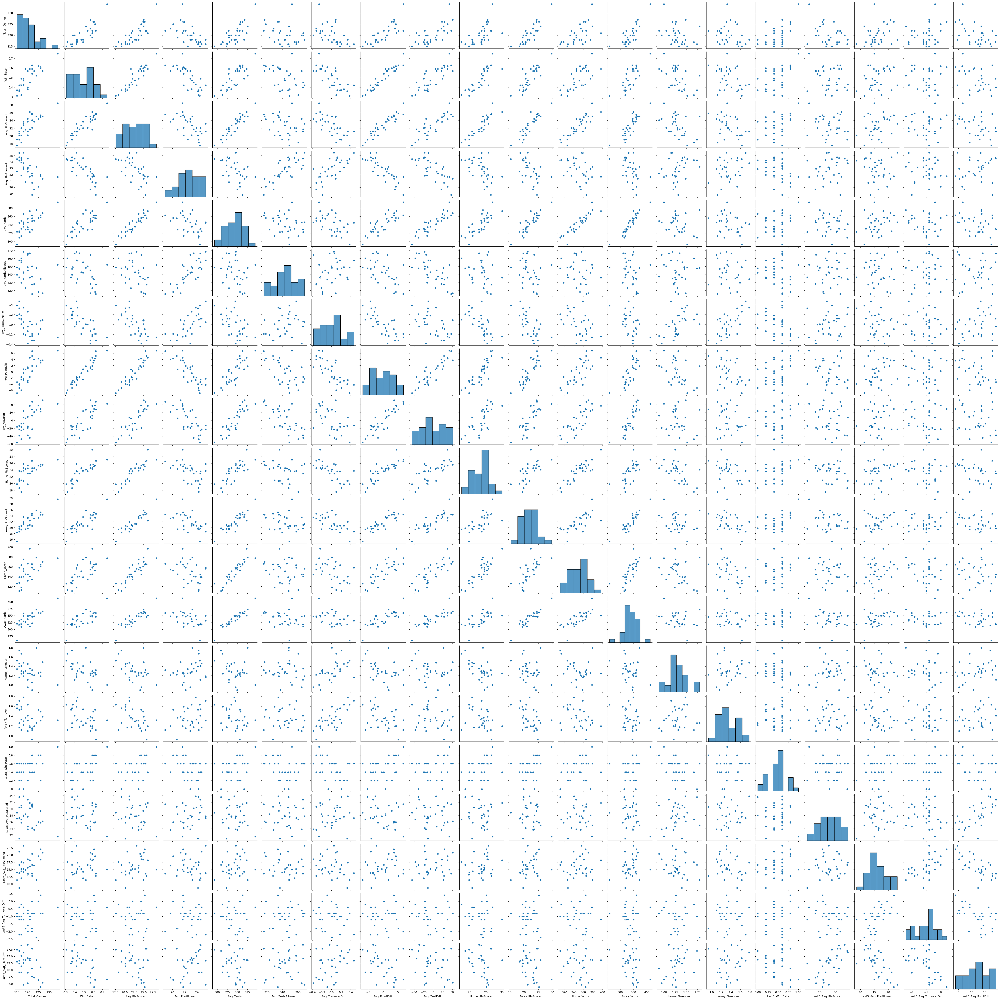

In [6]:
# Pairplot
pairs = sns.pairplot(teamstats)
plt.show()


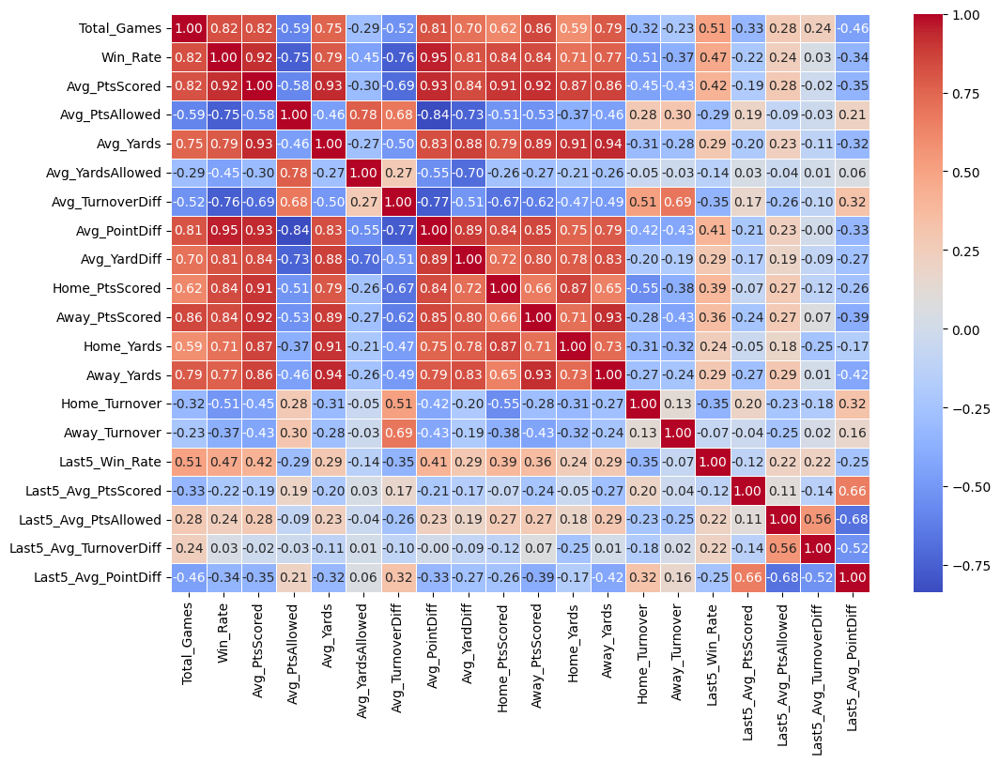

In [7]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Heatmap correlation matrix
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f', linewidths=0.5)

# Display the heatmap
plt.show()

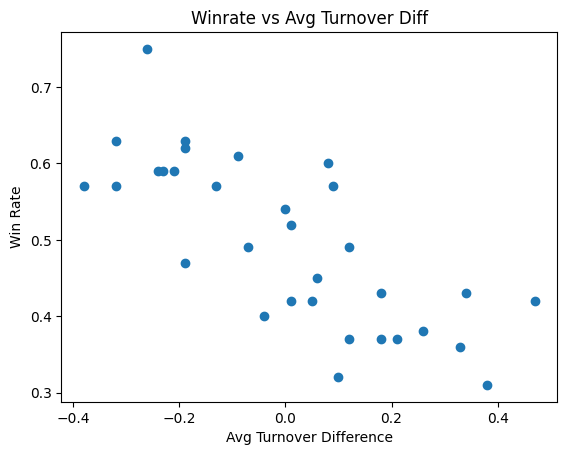

In [8]:
plt.scatter(teamstats.Avg_TurnoverDiff, teamstats.Win_Rate)
plt.xlabel('Avg Turnover Difference')
plt.ylabel('Win Rate')
plt.title('Winrate vs Avg Turnover Diff')
plt.show()

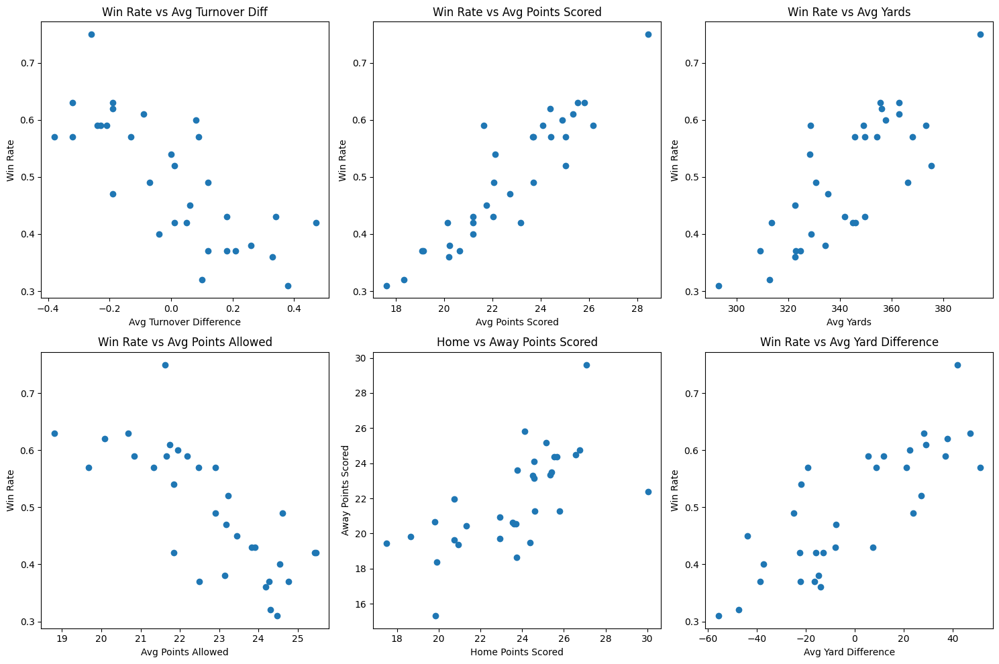

In [9]:
# Create a figure with 6 subplots (2 rows, 3 columns)
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Plot 1: Avg Turnover Diff vs Win Rate
axs[0, 0].scatter(teamstats.Avg_TurnoverDiff, teamstats.Win_Rate)
axs[0, 0].set_xlabel('Avg Turnover Difference')
axs[0, 0].set_ylabel('Win Rate')
axs[0, 0].set_title('Win Rate vs Avg Turnover Diff')

# Plot 2: Avg Points Scored vs Win Rate
axs[0, 1].scatter(teamstats.Avg_PtsScored, teamstats.Win_Rate)
axs[0, 1].set_xlabel('Avg Points Scored')
axs[0, 1].set_ylabel('Win Rate')
axs[0, 1].set_title('Win Rate vs Avg Points Scored')

# Plot 3: Avg Yards vs Win Rate
axs[0, 2].scatter(teamstats.Avg_Yards, teamstats.Win_Rate)
axs[0, 2].set_xlabel('Avg Yards')
axs[0, 2].set_ylabel('Win Rate')
axs[0, 2].set_title('Win Rate vs Avg Yards')

# Plot 4: Avg Points Allowed vs Win Rate
axs[1, 0].scatter(teamstats.Avg_PtsAllowed, teamstats.Win_Rate)
axs[1, 0].set_xlabel('Avg Points Allowed')
axs[1, 0].set_ylabel('Win Rate')
axs[1, 0].set_title('Win Rate vs Avg Points Allowed')

# Plot 5: Home Points Scored vs Away Points Scored
axs[1, 1].scatter(teamstats.Home_PtsScored, teamstats.Away_PtsScored)
axs[1, 1].set_xlabel('Home Points Scored')
axs[1, 1].set_ylabel('Away Points Scored')
axs[1, 1].set_title('Home vs Away Points Scored')

# Plot 6: Avg Yard Difference vs Win Rate
axs[1, 2].scatter(teamstats.Avg_YardDiff, teamstats.Win_Rate)
axs[1, 2].set_xlabel('Avg Yard Difference')
axs[1, 2].set_ylabel('Win Rate')
axs[1, 2].set_title('Win Rate vs Avg Yard Difference')

# Adjust layout to prevent overlap of labels and titles
plt.tight_layout()

# Show the plots
plt.show()

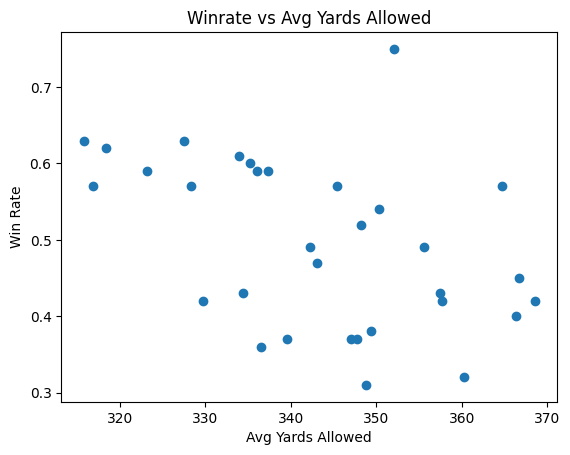

In [10]:
# Scatter plot of average yards allowed vs win rate
plt.scatter(teamstats.Avg_YardsAllowed, teamstats.Win_Rate)
plt.xlabel('Avg Yards Allowed')
plt.ylabel('Win Rate')
plt.title('Winrate vs Avg Yards Allowed')
plt.show()

In [11]:
# Bring in NFL game data from NFL.csv
NFL = pd.read_csv('NFL.csv')
NFL.head()

,Date,Week,Day,Time,Winner,Awaygame,Loser,PtsW,PtsL,YdsW,TOW,YdsL,TOL,Tie,PointDiff,YardDiff,TurnoverDiff,Home,Away
0,2017-09-07,1,Thu,8:30PM,Kansas City Chiefs,@,New England Patriots,42,27,537,1,371,0,0,15,166,1,False,True
1,2017-09-10,1,Sun,8:30PM,Dallas Cowboys,NaN,New York Giants,19,3,392,0,233,1,0,16,159,-1,True,False
2,2017-09-10,1,Sun,4:25PM,Green Bay Packers,NaN,Seattle Seahawks,17,9,370,1,225,1,0,8,145,0,True,False
3,2017-09-10,1,Sun,4:25PM,Carolina Panthers,@,San Francisco 49ers,23,3,287,2,217,2,0,20,70,0,False,True
4,2017-09-10,1,Sun,4:05PM,Los Angeles Rams,NaN,Indianapolis Colts,46,9,373,1,225,3,0,37,148,-2,True,False


In [12]:
# Drop the 'Awaygame' column from the NFL dataframe, rely on home/away columns instead
NFL = NFL.drop(columns=['Awaygame'])


In [13]:
# Drop rows where Tie column is 1
NFL = NFL[NFL['Tie'] == 0]
NFL.head()

,Date,Week,Day,Time,Winner,Loser,PtsW,PtsL,YdsW,TOW,YdsL,TOL,Tie,PointDiff,YardDiff,TurnoverDiff,Home,Away
0,2017-09-07,1,Thu,8:30PM,Kansas City Chiefs,New England Patriots,42,27,537,1,371,0,0,15,166,1,False,True
1,2017-09-10,1,Sun,8:30PM,Dallas Cowboys,New York Giants,19,3,392,0,233,1,0,16,159,-1,True,False
2,2017-09-10,1,Sun,4:25PM,Green Bay Packers,Seattle Seahawks,17,9,370,1,225,1,0,8,145,0,True,False
3,2017-09-10,1,Sun,4:25PM,Carolina Panthers,San Francisco 49ers,23,3,287,2,217,2,0,20,70,0,False,True
4,2017-09-10,1,Sun,4:05PM,Los Angeles Rams,Indianapolis Colts,46,9,373,1,225,3,0,37,148,-2,True,False


In [14]:
#Drop Tie column now
NFL = NFL.drop(columns=['Tie'])

In [15]:
NFL['Date'] = pd.to_datetime(NFL['Date'])

In [16]:
# Function to assign the season based on the Date
def get_season(date):
    if date.month >= 8:  # From August to December, the game is in the current year season
        return f'{date.year}-{date.year + 1}'
    else:  # From January to March, the game belongs to the previous year's season
        return f'{date.year - 1}-{date.year}'

# Apply the function to create the 'Season' column
NFL['Season'] = NFL['Date'].apply(get_season)


In [17]:
# Split the data by season
season_data = {season: NFL[NFL['Season'] == season] for season in NFL['Season'].unique()}

In [18]:
# Initialize a dictionary to store results by team and season
team_results = {}

# Iterate through each season and get results for each team
for season, data in season_data.items():
    # Initialize dictionary for this season
    season_team_results = {}
    
    # Get unique teams
    teams = set(data['Winner']).union(set(data['Loser']))  # All unique teams in the season
    
    for team in teams:
        # Get games where the team won
        won_games = data[data['Winner'] == team]
        
        # Get games where the team lost
        lost_games = data[data['Loser'] == team]
        
        # Store the results for this team in the season
        season_team_results[team] = {
            'won': won_games,
            'lost': lost_games
        }
    
    # Store the results for the season
    team_results[season] = season_team_results

In [19]:
# Access results for Dallas Cowboys in the 2017-2018 season
dallas_cowboys_2017_2018 = team_results['2017-2018']['Dallas Cowboys']

# Display won games
print(dallas_cowboys_2017_2018['won'])

# Display lost games
print(dallas_cowboys_2017_2018['lost'])


          Date Week  Day    Time          Winner                  Loser  PtsW  \
1   2017-09-10    1  Sun  8:30PM  Dallas Cowboys        New York Giants    19   
46  2017-09-25    3  Mon  8:30PM  Dallas Cowboys      Arizona Cardinals    28   
99  2017-10-22    7  Sun  4:05PM  Dallas Cowboys    San Francisco 49ers    40   
115 2017-10-29    8  Sun  4:25PM  Dallas Cowboys  Washington Commanders    33   
128 2017-11-05    9  Sun  4:25PM  Dallas Cowboys     Kansas City Chiefs    28   
176 2017-11-30   13  Thu  8:25PM  Dallas Cowboys  Washington Commanders    38   
202 2017-12-10   14  Sun  1:00PM  Dallas Cowboys        New York Giants    30   
211 2017-12-17   15  Sun  8:30PM  Dallas Cowboys      Las Vegas Raiders    20   
253 2017-12-31   17  Sun  1:00PM  Dallas Cowboys    Philadelphia Eagles     6   

     PtsL  YdsW  TOW  YdsL  TOL  PointDiff  YardDiff  TurnoverDiff   Home  \
1       3   392    0   233    1         16       159            -1   True   
46     17   273    0   332    0    

In [20]:
# Additional features
# Total Points
NFL['TotalPoints'] = NFL['PtsW'] + NFL['PtsL']

# Total yards
NFL['TotalYards'] = NFL['YdsW'] + NFL['YdsL']

# Total Turnovers
NFL['TotalTurnovers'] = NFL['TOW'] + NFL['TOL']

# Turnover Ratio
NFL['TurnoverRatio'] = NFL['TOW'] / NFL['TOL'].replace(0, 1)  # Avoid division by zero

# Yard Efficiency
NFL['YardEfficiencyW'] = NFL['YdsW'] / NFL['PtsW']
NFL['YardEfficiencyL'] = NFL['YdsL'] / NFL['PtsL']

# Scoring Efficieny
NFL['ScoringEfficiencyW'] = NFL['PtsW'] / NFL['YdsW']
NFL['ScoringEfficiencyL'] = NFL['PtsL'] / NFL['YdsL']

# Round to 2 decimals
NFL[['TotalYards', 'TotalTurnovers', 'TurnoverRatio', 'YardEfficiencyW', 'YardEfficiencyL', 'ScoringEfficiencyW', 'ScoringEfficiencyL']] = NFL[['TotalYards', 'TotalTurnovers', 'TurnoverRatio', 'YardEfficiencyW', 'YardEfficiencyL', 'ScoringEfficiencyW', 'ScoringEfficiencyL']].round(2)


In [21]:
NFL.head(3)

,Date,Week,Day,Time,Winner,Loser,PtsW,PtsL,YdsW,TOW,...,Away,Season,TotalPoints,TotalYards,TotalTurnovers,TurnoverRatio,YardEfficiencyW,YardEfficiencyL,ScoringEfficiencyW,ScoringEfficiencyL
0,2017-09-07,1,Thu,8:30PM,Kansas City Chiefs,New England Patriots,42,27,537,1,...,True,2017-2018,69,908,1,1.0,12.79,13.74,0.08,0.07
1,2017-09-10,1,Sun,8:30PM,Dallas Cowboys,New York Giants,19,3,392,0,...,False,2017-2018,22,625,1,0.0,20.63,77.67,0.05,0.01
2,2017-09-10,1,Sun,4:25PM,Green Bay Packers,Seattle Seahawks,17,9,370,1,...,False,2017-2018,26,595,2,1.0,21.76,25.00,0.05,0.04


In [22]:
NFL = NFL[['Date', 'Week', 'Day', 'Time', 'Winner', 'Loser', 'PtsW', 'PtsL', 'TotalPoints', 'PointDiff',
        'YdsW', 'YdsL', 'YardDiff', 'TOW', 'TOL', 'TotalTurnovers', 'TurnoverDiff', 'TotalYards', 'TurnoverRatio',
        'YardEfficiencyW', 'YardEfficiencyL', 'ScoringEfficiencyW', 'ScoringEfficiencyL', 'Home', 'Away',]]


In [23]:
# Describe data in NFL
NFL.drop(columns=['Date']).describe()

/Users/jonathan/Library/Python/3.9/lib/python/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,PtsW,PtsL,TotalPoints,PointDiff,YdsW,YdsL,YardDiff,TOW,TOL,TotalTurnovers,TurnoverDiff,TotalYards,TurnoverRatio,YardEfficiencyW,YardEfficiencyL,ScoringEfficiencyW,ScoringEfficiencyL
count,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.000000,1917.00,1917.000000,1917.000000
mean,28.418362,17.173187,45.591549,11.245175,371.888367,316.825769,55.062598,0.867501,1.786124,2.653625,-0.918623,688.714137,0.582415,13.936109,inf,0.077334,0.053276
std,8.492428,8.271505,14.141973,9.004602,77.829219,82.799711,106.671815,0.909916,1.258854,1.569544,1.536831,120.197683,0.721951,4.239862,NaN,0.020912,0.021994
min,3.000000,0.000000,3.000000,1.000000,136.000000,47.000000,-326.000000,0.000000,0.000000,0.000000,-6.000000,324.000000,0.000000,4.630000,5.30,0.010000,0.000000
25%,23.000000,10.000000,36.000000,4.000000,320.000000,260.000000,-16.000000,0.000000,1.000000,2.000000,-2.000000,605.000000,0.000000,11.220000,14.92,0.060000,0.040000
50%,27.000000,17.000000,44.000000,8.000000,372.000000,314.000000,54.000000,1.000000,2.000000,3.000000,-1.000000,682.000000,0.330000,13.290000,18.54,0.080000,0.050000
75%,34.000000,23.000000,55.000000,16.000000,421.000000,373.000000,126.000000,1.000000,3.000000,4.000000,0.000000,768.000000,1.000000,15.890000,25.12,0.090000,0.070000
max,70.000000,51.000000,105.000000,50.000000,726.000000,613.000000,468.000000,5.000000,7.000000,9.000000,5.000000,1151.000000,5.000000,77.000000,inf,0.220000,0.190000


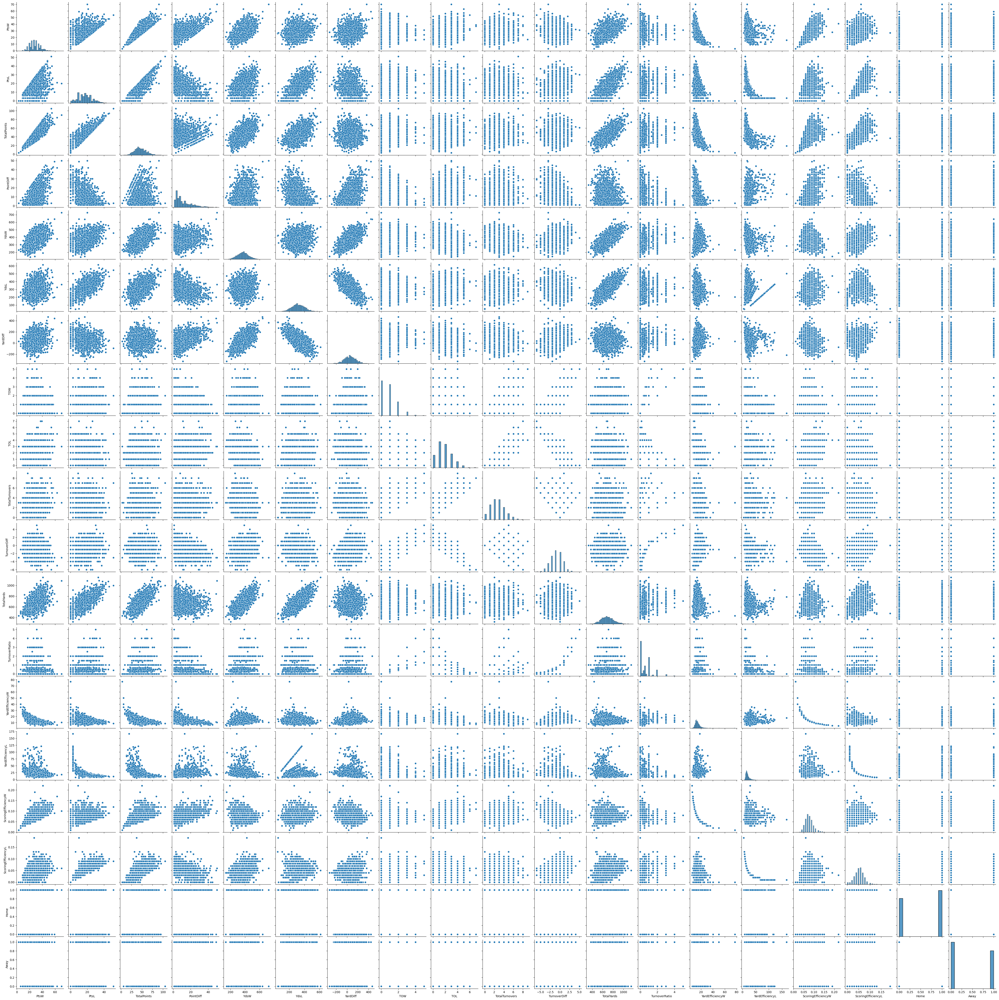

In [24]:
# Pairplot
pairs = sns.pairplot(NFL)
plt.show()


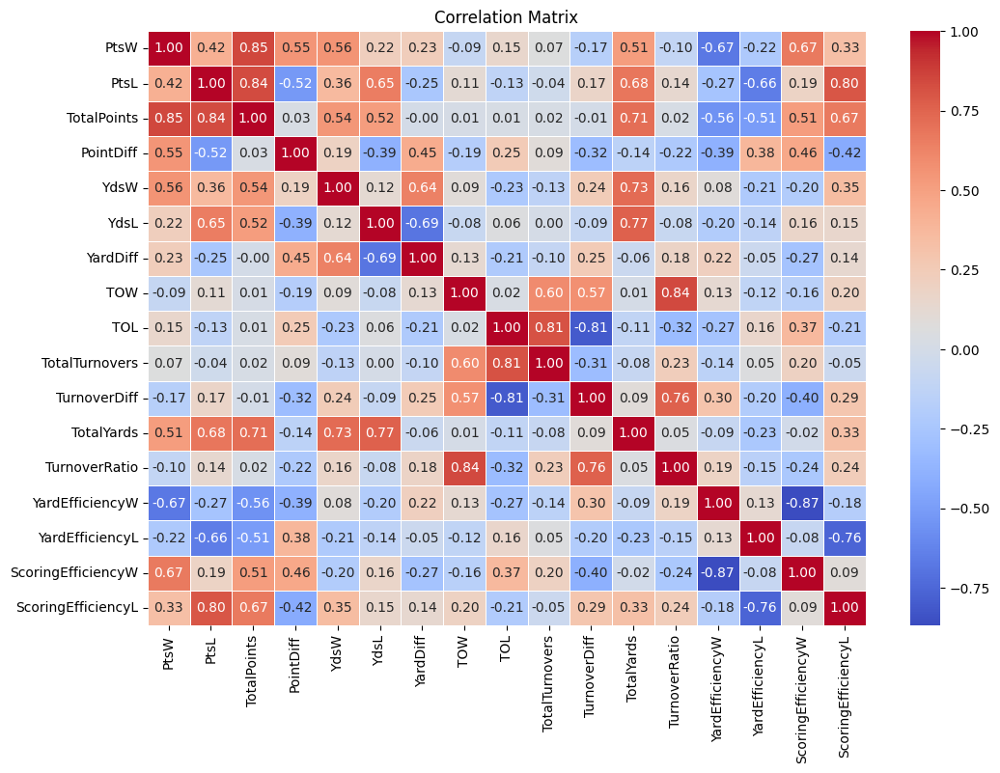

In [25]:
# Select only numeric columns
numeric_cols = NFL.select_dtypes(include=['number']).columns

# Compute the correlation matrix on just the numeric columns
correlation_matrix = NFL[numeric_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [26]:
# View matrix
correlation_matrix

,PtsW,PtsL,TotalPoints,PointDiff,YdsW,YdsL,YardDiff,TOW,TOL,TotalTurnovers,TurnoverDiff,TotalYards,TurnoverRatio,YardEfficiencyW,YardEfficiencyL,ScoringEfficiencyW,ScoringEfficiencyL
PtsW,1.000000,0.423205,0.848041,0.554370,0.556131,0.222654,0.232935,-0.090488,0.146925,0.065382,-0.173925,0.513478,-0.103531,-0.671124,-0.219012,0.671525,0.329147
PtsL,0.423205,1.000000,0.839031,-0.519453,0.360199,0.654627,-0.245322,0.112270,-0.125460,-0.035539,0.169239,0.684180,0.138227,-0.267411,-0.655453,0.188087,0.799058
TotalPoints,0.848041,0.839031,1.000000,0.029083,0.544640,0.516591,-0.003606,0.011326,0.014850,0.018477,-0.005458,0.708520,0.018676,-0.559425,-0.509784,0.513269,0.665018
PointDiff,0.554370,-0.519453,0.029083,1.000000,0.193625,-0.391342,0.445035,-0.188471,0.253814,0.094309,-0.319493,-0.144207,-0.224616,-0.387311,0.382199,0.460555,-0.423579
YdsW,0.556131,0.360199,0.544640,0.193625,1.000000,0.119045,0.637210,0.091502,-0.231741,-0.132822,0.244000,0.729516,0.160806,0.082195,-0.213171,-0.198541,0.346909
YdsL,0.222654,0.654627,0.516591,-0.391342,0.119045,1.000000,-0.689353,-0.075525,0.058072,0.002792,-0.092284,0.765945,-0.078708,-0.201496,-0.136457,0.163226,0.148697
YardDiff,0.232935,-0.245322,-0.003606,0.445035,0.637210,-0.689353,1.000000,0.125384,-0.214158,-0.099076,0.249658,-0.062270,0.178421,0.216374,-0.051728,-0.271556,0.137689
TOW,-0.090488,0.112270,0.011326,-0.188471,0.091502,-0.075525,0.125384,1.000000,0.022179,0.597521,0.573905,0.007222,0.842780,0.131499,-0.122960,-0.160928,0.195391
TOL,0.146925,-0.125460,0.014850,0.253814,-0.231741,0.058072,-0.214158,0.022179,1.000000,0.814908,-0.805992,-0.110051,-0.320986,-0.272230,0.157803,0.369302,-0.207487
TotalTurnovers,0.065382,-0.035539,0.018477,0.094309,-0.132822,0.002792,-0.099076,0.597521,0.814908,1.000000,-0.313735,-0.084080,0.231139,-0.142108,0.054410,0.202904,-0.053141


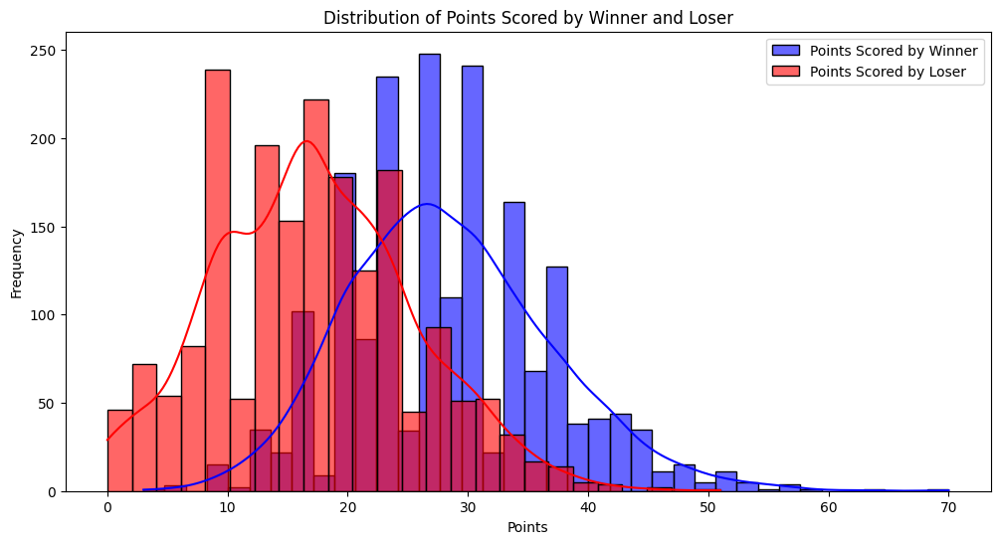

In [ ]:
# Plotting the distribution of points scored by the winner and loser
plt.figure(figsize=(12, 6))

# Plot the points scored by the winner (PtsW)
sns.histplot(NFL['PtsW'], kde=True, color='blue', label='Points Scored by Winner', alpha=0.6)

# Plot the points scored by the loser (PtsL)
sns.histplot(NFL['PtsL'], kde=True, color='red', label='Points Scored by Loser', alpha=0.6)

# Adding the title and labels
plt.title("Distribution of Points Scored by Winner and Loser")
plt.xlabel("Points")
plt.ylabel("Frequency")

# Display the legend
plt.legend()

# Show the plot
plt.show()


Investigating Turnover related relations

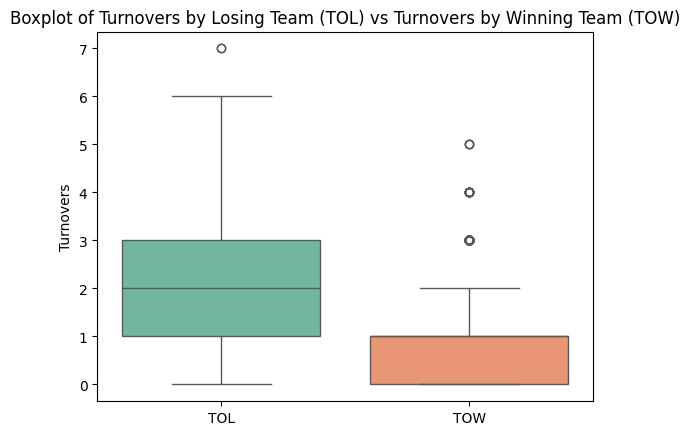

In [28]:
# TOW and TOL boxplot
sns.boxplot(data=[NFL['TOL'], NFL['TOW']], palette='Set2')

# Set the title and labels
plt.title('Boxplot of Turnovers by Losing Team (TOL) vs Turnovers by Winning Team (TOW)')
plt.xticks([0, 1], ['TOL', 'TOW'])
plt.ylabel('Turnovers')

# Show the plot
plt.show()

As expected teams with less turnovers generally win more

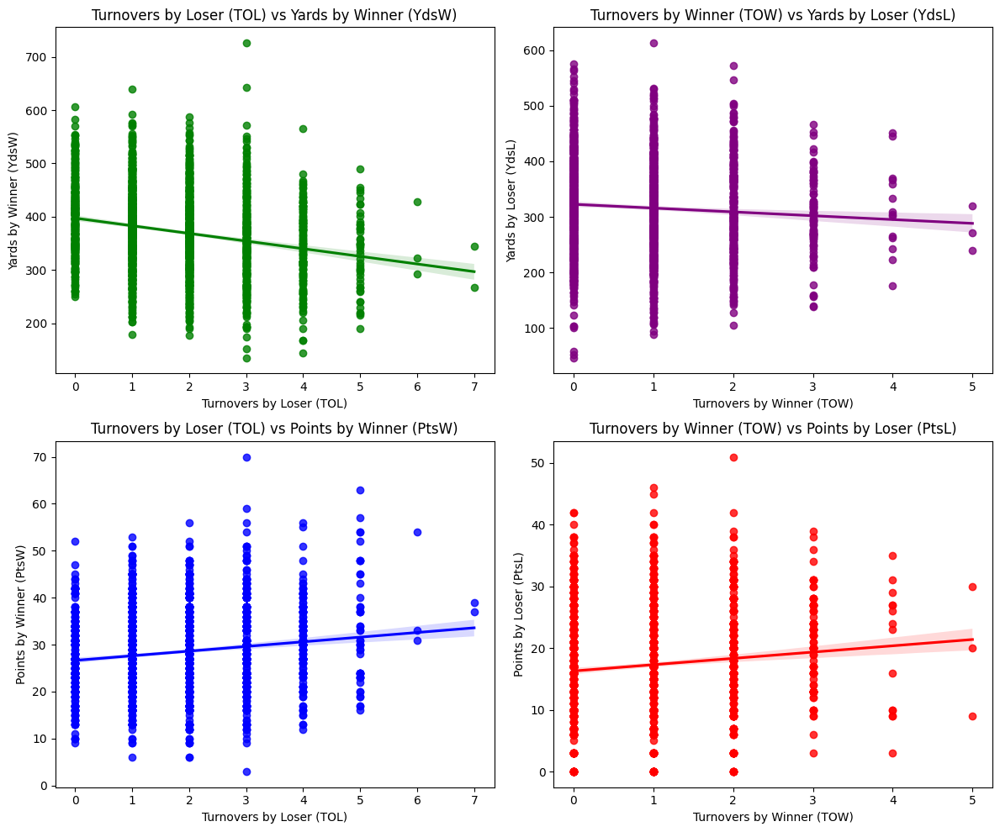

In [29]:
# Set up a 2x2 grid for subplots
plt.figure(figsize=(12, 10))

# Scatter plot 1: Turnovers by Loser vs Yards by Winner
plt.subplot(2, 2, 1)  # 2 rows, 2 columns, first subplot
sns.regplot(data=NFL, x='TOL', y='YdsW', fit_reg=True, color='green')
plt.title("Turnovers by Loser (TOL) vs Yards by Winner (YdsW)")
plt.xlabel("Turnovers by Loser (TOL)")
plt.ylabel("Yards by Winner (YdsW)")

# Scatter plot 2: Turnovers by Winner vs Yards by Loser
plt.subplot(2, 2, 2)  # 2 rows, 2 columns, second subplot
sns.regplot(data=NFL, x='TOW', y='YdsL', fit_reg=True, color='purple')
plt.title("Turnovers by Winner (TOW) vs Yards by Loser (YdsL)")
plt.xlabel("Turnovers by Winner (TOW)")
plt.ylabel("Yards by Loser (YdsL)")

# Scatter plot 3: Turnovers by Loser vs Points by Winner
plt.subplot(2, 2, 3)  # 2 rows, 2 columns, third subplot
sns.regplot(data=NFL, x='TOL', y='PtsW', fit_reg=True, color='blue')
plt.title("Turnovers by Loser (TOL) vs Points by Winner (PtsW)")
plt.xlabel("Turnovers by Loser (TOL)")
plt.ylabel("Points by Winner (PtsW)")

# Scatter plot 4: Turnovers by Winner vs Points by Loser
plt.subplot(2, 2, 4)  # 2 rows, 2 columns, fourth subplot
sns.regplot(data=NFL, x='TOW', y='PtsL', fit_reg=True, color='red')
plt.title("Turnovers by Winner (TOW) vs Points by Loser (PtsL)")
plt.xlabel("Turnovers by Winner (TOW)")
plt.ylabel("Points by Loser (PtsL)")

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


These trends generally make sense, more turnovers by a team would mean the opposing teams offense needs less yards to score.

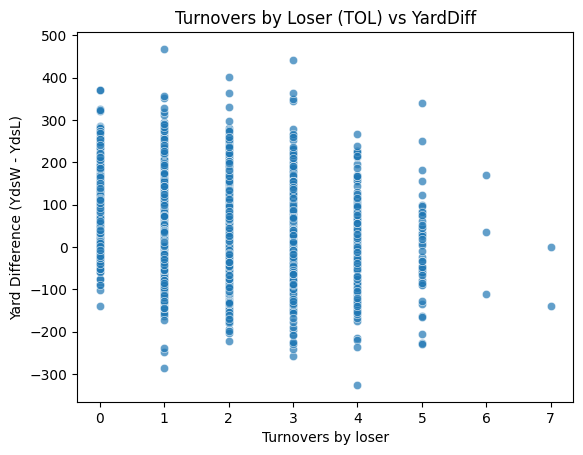

In [30]:
# TOL vs Yard diff
sns.scatterplot(data=NFL, x='TOL', y='YardDiff', alpha=0.7)
plt.xlabel('Turnovers by loser')
plt.ylabel('Yard Difference (YdsW - YdsL)')
plt.title('Turnovers by Loser (TOL) vs YardDiff')
plt.show()

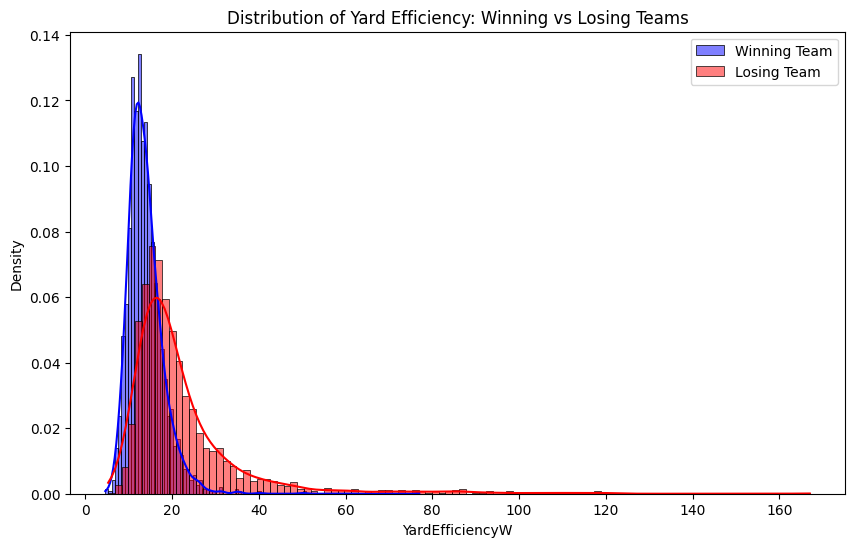

In [ ]:
# Distribution of Yard Efficiency for Winning and Losing Teams
plt.figure(figsize=(10, 6))
sns.histplot(NFL['YardEfficiencyW'], kde=True, color='blue', label='Winning Team', stat='density')
sns.histplot(NFL['YardEfficiencyL'], kde=True, color='red', label='Losing Team', stat='density')
plt.title('Distribution of Yard Efficiency: Winning vs Losing Teams')
plt.legend()
plt.show()

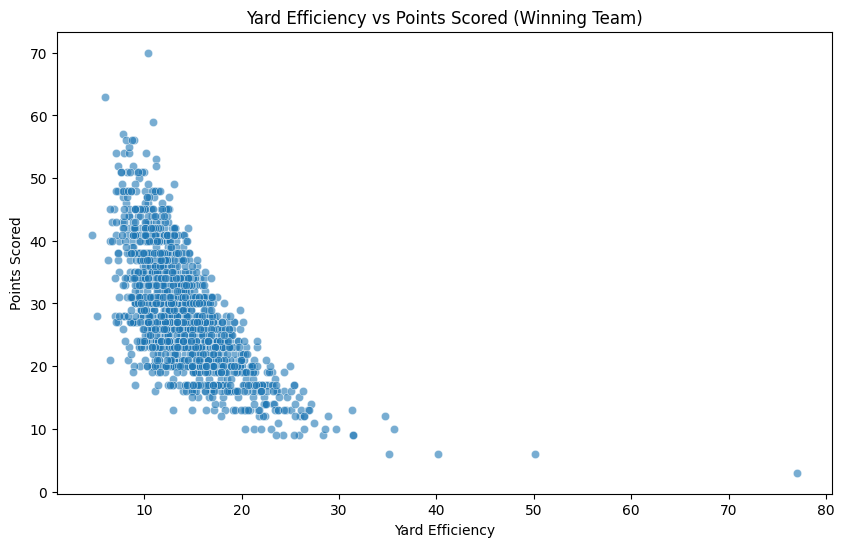

In [32]:
# Scatter plot for Yard Efficiency vs Points Scored
plt.figure(figsize=(10, 6))
sns.scatterplot(x=NFL['YardEfficiencyW'], y=NFL['PtsW'], alpha=0.6)
plt.title('Yard Efficiency vs Points Scored (Winning Team)')
plt.xlabel('Yard Efficiency')
plt.ylabel('Points Scored')
plt.show()

/var/folders/pm/v1wywnps12sf4vmw4zxrydwr0000gn/T/ipykernel_33805/1529402298.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Winner', y='YardEfficiencyW', data=NFL, palette='Set2')


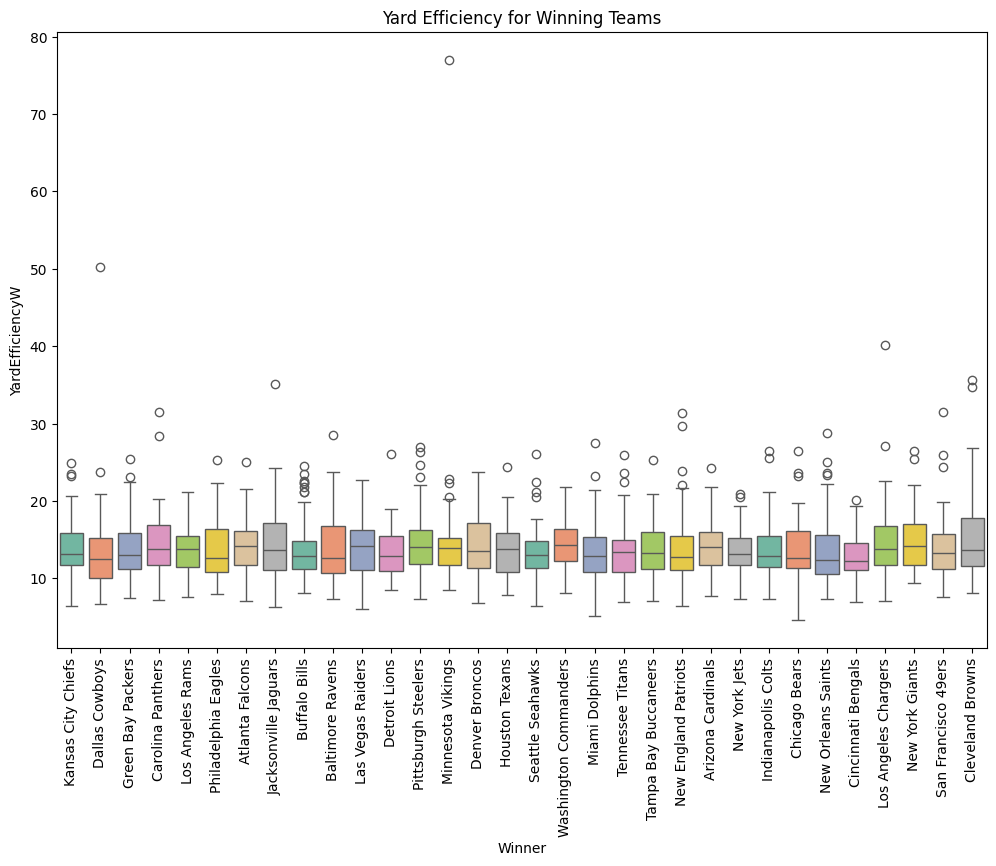

In [33]:
# Boxplot of Yard Efficiency for Winning and Losing Teams
plt.figure(figsize=(12, 8))
sns.boxplot(x='Winner', y='YardEfficiencyW', data=NFL, palette='Set2')
plt.title('Yard Efficiency for Winning Teams')
plt.xticks(rotation=90)
plt.show()

In [34]:
# Filter the data for games involving the Steelers
vikings_games = NFL[(NFL['Winner'] == 'Minnesota Vikings') | (NFL['Loser'] == 'Minnesota Vikings')]
vikings_games[['Date', 'Winner', 'Loser', 'YardEfficiencyW', 'YardEfficiencyL', 'PtsW', 'PtsL']]

# Find extreme outlier games
vikings_outlier=vikings_games[vikings_games['YardEfficiencyW'] > vikings_games['YardEfficiencyW'].quantile(0.95)]
print(vikings_outlier[['Date', 'Winner', 'Loser', 'YardEfficiencyW', 'PtsW', 'YdsW', 'YdsL']])

           Date             Winner                  Loser  YardEfficiencyW  \
189  2017-12-03  Minnesota Vikings        Atlanta Falcons            22.29   
640  2019-10-24  Minnesota Vikings  Washington Commanders            22.84   
1123 2021-10-03   Cleveland Browns      Minnesota Vikings            23.36   
1189 2021-10-31     Dallas Cowboys      Minnesota Vikings            20.95   
1818 2023-11-27      Chicago Bears      Minnesota Vikings            26.42   
1833 2023-12-10  Minnesota Vikings      Las Vegas Raiders            77.00   

      PtsW  YdsW  YdsL  
189     14   312   275  
640     19   434   216  
1123    14   327   255  
1189    20   419   278  
1818    12   317   242  
1833     3   231   202  


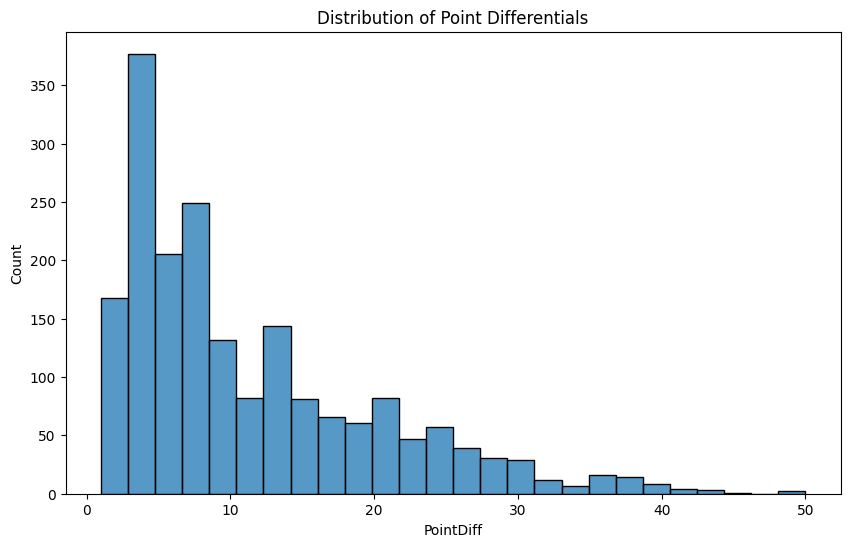

In [35]:
# Plotting PointDiff to check how convincing the victories are
plt.figure(figsize=(10,6))
sns.histplot(NFL['PointDiff'])
plt.title('Distribution of Point Differentials')
plt.show()